In [5]:
import os
import glob
import collections
import subprocess as sp
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from operator import itemgetter
from networkx.classes.multidigraph import MultiDiGraph
from networkx.drawing.nx_agraph import read_dot, write_dot, graphviz_layout

import stats
import graphs
import sqlite_helper as helper

In [6]:
# Needs to be done when there are changes in these files ...
import importlib
importlib.reload(helper)
importlib.reload(stats)
importlib.reload(graphs)
print("Updates imports")

Updates imports


# Helper functions

In [7]:
def get_name_from_dot(path):
    # Remove last dot, remove last 3 "_" which are hardcoded
    return path.split("/")[-1].rsplit(".", 1)[0].rsplit("_", 3)[0]

def get_name_from_db_bench(name):
    return name.replace("/", "-")

# Load Tag Data

In [14]:
db_path_tags = "/Users/christopher/Uni/MasterThesis/experiment_4_roaring/measurements.db"
measurements_tags = helper.get_all_measurements(db_path_tags, start_form_count=1)
grouped_by_tag = helper.group_measurements_by_property(measurements_tags, -2)

# Group by benchmark within tags
for tag in grouped_by_tag.keys():
    
    grouped_by_tag[tag] = helper.group_measurements_by_property(grouped_by_tag[tag], -3)

In [15]:
# Add seperately loaded tag data
db_path = "/Users/christopher/Uni/MasterThesis/experiment_4_roaring/stopped_exp.db"
m1 = helper.get_all_measurements(db_path, start_form_count=1)
grouped_by_tag_single = helper.group_measurements_by_property(m1, -1)

# Group by benchmark within tags
for tag in grouped_by_tag_single.keys():
    grouped_by_tag_single[tag] = helper.group_measurements_by_property(grouped_by_tag_single[tag], -2)

OperationalError: no such column: count_idx

In [12]:
# Add single
grouped_by_tag["v1.3.0"] = grouped_by_tag_single["v1.3.0"]

NameError: name 'grouped_by_tag_single' is not defined

v1.2.0 BenchmarkChecksum/checksum-1 1.2504794753787867
v1.2.0 BenchmarkChecksum/checksum-16 3.0419847815309775
v1.2.0 BenchmarkChecksum/checksum-compressed-262144 1.6878630088980457


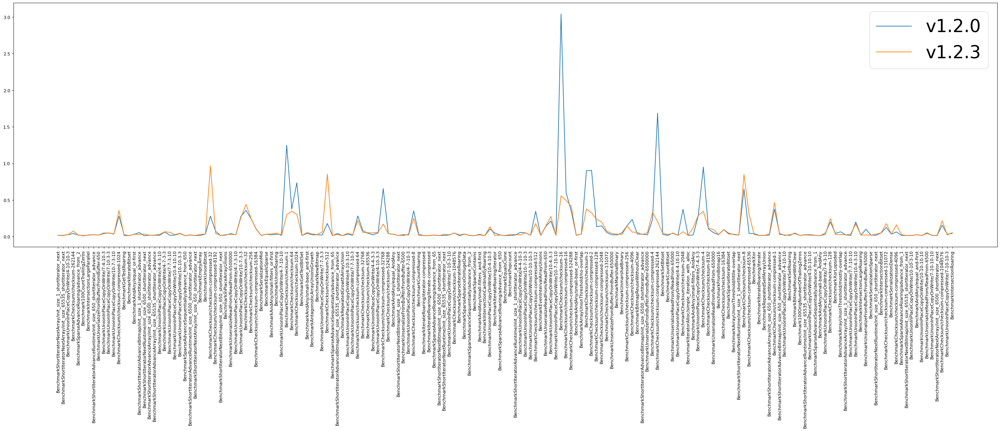

In [16]:
unstable_benchmarks = []
stability_measures = {}

plt.figure(figsize=(40, 10), dpi=80)

labels=list(next(iter(grouped_by_tag.values())).keys())
plt.xticks([x for x in range(len(labels))], labels, rotation='vertical')

for tag in grouped_by_tag.keys():
    cv = []
    spread = []
    for bench in grouped_by_tag[tag].keys():
        x = []
        measurments = grouped_by_tag[tag][bench]
        for entry in measurments:
            x.append(entry[2])
        current_cv = stats.cv(x)
        cv.append(current_cv)
        try:
            stability_measures[get_name_from_db_bench(bench)].append(current_cv)
        except KeyError:
            stability_measures[get_name_from_db_bench(bench)] = [current_cv]

        if (current_cv) > 1:
            print(f"{tag} {bench} {current_cv}")
            unstable_benchmarks.append(get_name_from_db_bench(bench))
        spread.append(stats.max_spread(x))

    plt.plot(cv, label=tag)
plt.legend(fontsize="40")
plt.show()

In [17]:
unstable_benchmarks

['BenchmarkChecksum-checksum-1',
 'BenchmarkChecksum-checksum-16',
 'BenchmarkChecksum-checksum-compressed-262144']

BenchmarkMarshal/SimpleDocument/map [790.1, 784.9, 780.8, 785.4, 788.3, 784.6]
BenchmarkMarshal/SimpleDocument/map [760.0, 761.2, 763.7, 758.2, 758.8, 761.7, 777.5, 767.1, 770.4, 769.1, 774.4, 766.7, 765.7, 762.2, 763.0, 777.7, 768.2, 774.6]
BenchmarkMarshal/SimpleDocument/map [765.7, 791.9, 763.9, 755.0, 762.8, 761.6, 758.5, 760.9, 755.2, 760.3, 1567.0, 756.1, 759.2, 768.4, 757.0, 768.1, 767.1, 757.6]


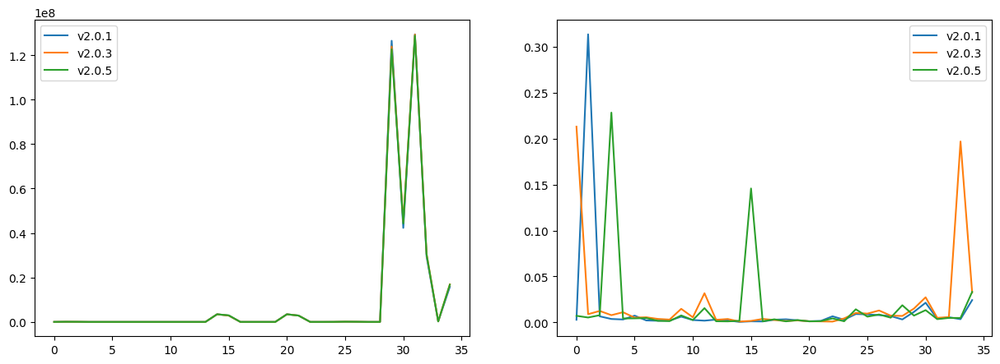

In [235]:
fig, axs = plt.subplots(1, 2,figsize=(15,5))

for tag in [group_201, group_203, group_205]:
    cv = []
    mean = []
    max = []
    od = collections.OrderedDict(sorted(tag.items()))
    for idx, (k, data) in enumerate(od.items()):
        x = []
        for entry in data:
            x.append(entry[2])
        cv.append(stats.cv(x))
        mean.append(np.mean(x))
        max.append(np.max(x))

        if idx == 3:
            print(k, x)

    axs[0].plot(mean, label=data[0][-1])
    axs[1].plot(cv, label=data[0][-1])

axs[0].legend()
axs[1].legend()
plt.show()

In [172]:
od = collections.OrderedDict(sorted(group_203.items()))
for k, v in od.items(): print(k, v)

BenchmarkMarshal/HugoFrontMatter [(205, 102288, 11455.0, 1, 3, 2, 3, 1, 1, 1, 1, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (206, 102176, 11603.0, 1, 3, 2, 3, 1, 2, 1, 1, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (207, 99442, 11464.0, 1, 3, 2, 3, 1, 3, 1, 1, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (208, 101880, 11421.0, 1, 3, 2, 3, 1, 1, 2, 1, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (209, 101330, 11562.0, 1, 3, 2, 3, 1, 2, 2, 1, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (210, 102165, 11532.0, 1, 3, 2, 3, 1, 3, 2, 1, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (415, 100142, 11660.0, 1, 3, 2, 3, 1, 1, 1, 2, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (416, 101732, 11526.0, 1, 3, 2, 3, 1, 2, 1, 2, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (417, 100688, 11655.0, 1, 3, 2, 3, 1, 3, 1, 2, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (418, 101935, 11647.0, 1, 3, 2, 3, 1, 1, 2, 2, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (419, 99502, 11527.0, 1, 3,

In [47]:
intersect = set()
for tag in grouped_by_tags.keys():
    group_by_bench = helper.group_measurements_by_name(grouped_by_tags[tag], -2)
    print(group_by_bench.keys())
    if intersect.__len__() == 0:
        intersect = set(group_by_bench.keys())
    else:
        intersect = intersect.intersection(set(group_by_bench.keys()))
print(intersect)


dict_keys(['BenchmarkScanComments/1MValid', 'BenchmarkScanComments/10ValidUtf8', 'BenchmarkScanComments/1kValidUtf8', 'BenchmarkScanComments/1MValidUtf8', 'BenchmarkScanComments/10Valid', 'BenchmarkScanComments/1kValid', 'BenchmarkParseLiteralStringValid/10Valid'])
dict_keys(['BenchmarkScanComments/1MValid', 'BenchmarkScanComments/10ValidUtf8', 'BenchmarkScanComments/1kValidUtf8', 'BenchmarkScanComments/1MValidUtf8', 'BenchmarkScanComments/10Valid', 'BenchmarkScanComments/1kValid', 'BenchmarkParseLiteralStringValid/10Valid'])
dict_keys(['BenchmarkScanComments/1MValid', 'BenchmarkScanComments/10ValidUtf8', 'BenchmarkScanComments/1kValidUtf8', 'BenchmarkScanComments/1MValidUtf8', 'BenchmarkScanComments/10Valid', 'BenchmarkScanComments/1kValid', 'BenchmarkParseLiteralStringValid/10Valid'])
{'BenchmarkScanComments/1MValidUtf8', 'BenchmarkScanComments/1kValidUtf8', 'BenchmarkScanComments/10Valid', 'BenchmarkParseLiteralStringValid/10Valid', 'BenchmarkScanComments/10ValidUtf8', 'BenchmarkSca

# PPROF files

In [17]:
graph_paths0 = "/Users/christopher/Uni/MasterThesis/experiment_4_roaring/instance0/backup-mt-1-instance-0/"
graph_paths1 = "/Users/christopher/Uni/MasterThesis/experiment_4_roaring/instance1/backup-mt-1-instance-1/"

In [18]:
dot_files = []
for graph_paths in [graph_paths0, graph_paths1]:
    # Convert files to dot files for further analysis

    # Clear existing dot files
    for existingDotFile in glob.glob(graph_paths + "*.dot"):
        os.remove(existingDotFile)

    if len(glob.glob(graph_paths + "*.dot")) == 0:
        files = glob.glob(graph_paths + "*")
        for file in files:
            
            if file.endswith(".dot"):
                continue
            
            name = file.split(".out")[0]
            command = f"go tool pprof -nodecount=3000 --nodefraction=0.0 --edgefraction=0.0 -dot {name}.out > {name}.dot"
            stream = os.popen(command)
            output = stream.read()
            

    dot_files.extend(glob.glob(graph_paths + "*.dot"))

In [19]:
len(dot_files)

383

In [20]:
"""Load and convert all graphs, and generate a unique node mapping."""
count_bad_input = 0
ordered_graphs = {}
none_perf_benchs = []
removed_node_name = set()
for dot_file in dot_files:
    name = get_name_from_dot(dot_file)

    if "BenchmarkSize" in name or "BenchmarkMemory" in name:
        none_perf_benchs.append(name)
        continue
    
    try:
        curr_graph = read_dot(dot_file)
        curr_graph = graphs.convertWeigthsToFloat(curr_graph)
    except ValueError: 
        count_bad_input += 1
        print(dot_file.split("/")[-1])
        continue

    # Removing starting nodes like file, type etc.
    try:
        name_first_node = list(curr_graph.nodes(data=True))[0][0]
        if name_first_node != "N1":
            removed_node_name.add(name_first_node)
            curr_graph.remove_node(name_first_node)
    except Exception as e:
        print(e)

    # Add all graphs from the same benchmark together and later form the union
    try: 
        ordered_graphs[name].append(curr_graph)
    except KeyError:
       ordered_graphs[name] = []
       ordered_graphs[name].append(curr_graph)


print(f"Bad input: {count_bad_input}")
print(f"None perf benchmarks: {none_perf_benchs}")
print(f"Removed node names: {removed_node_name}")

Bad input: 0
None perf benchmarks: ['05-28-2023_BenchmarkSizeRoaring', '05-28-2023_BenchmarkMemoryUsage', '05-28-2023_BenchmarkSizeBitset', '05-28-2023_BenchmarkSizeRoaring', '05-28-2023_BenchmarkMemoryUsage', '05-28-2023_BenchmarkSizeBitset']
Removed node names: {'File: roaring64.test', 'File: roaring.test', 'Type: cpu'}


In [21]:
all_graphs = [val for sublist in ordered_graphs.values() for val in sublist]
nameMappingFull = graphs.generateUniqueNodeMapping(all_graphs)

In [22]:
final_graphs = []
for keys in ordered_graphs.keys():
    
    if len(ordered_graphs[keys]) != 2:
        print(keys, len(ordered_graphs[keys]))

    union_graphs = []
    for graph in ordered_graphs[keys]:
        mapping = graphs.getNodeNameMapping(graph)
        
        nodeMapping = {}
        # get node name by value
        for key in mapping:
            nodeMapping[key] = nameMappingFull[mapping[key]]

        union_graphs.append(nx.relabel_nodes(graph, nodeMapping))

    final_graphs.append(nx.compose_all(union_graphs))

06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-4-10-3-10 1
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-4-7-3-3 1
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-10-10-3-10 1
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-4-10-3-3 1
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-4-7-10-3 1
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-7-10-3-10 1
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-4-4-3-3 1
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-4-4-10-3 1
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-7-4-10-10 1
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-7-4-3-10 1
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-10-10-3-3 1
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-7-7-3-10 1
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-10-7-10-3 1
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-10-4-10-3 1
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-4-4-10-10 1
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-10-4-10-10 1
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-10-10-10-10 1
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-7-4-10-3 

In [23]:
len(final_graphs)

207

In [24]:
""" Generate full graph, position and labels."""
labeldict = {v: k for k, v in nameMappingFull.items()}
full_graph = nx.compose_all(final_graphs)
pos_full = graphviz_layout(full_graph, prog='dot')

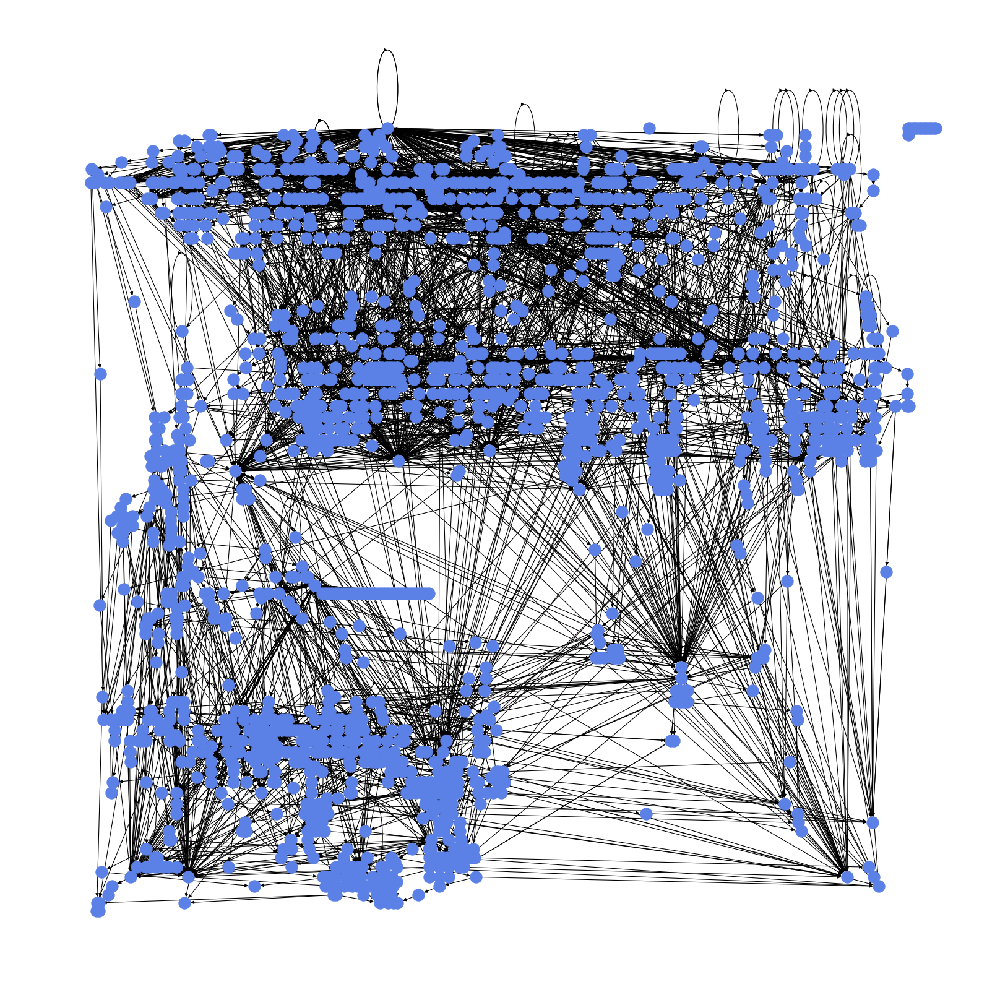

In [32]:
plt.figure(figsize=(20, 20), dpi=80)
nx.draw(full_graph, pos_full, arrows=True, node_color="#5c81e6")
plt.show()

In [ ]:
plt.figure(figsize=(20, 20), dpi=80)
nx.draw(final_graphs[4], pos_full, with_labels=labeldict, arrows=True, node_color="blue")
plt.show()

# 1. Reduce Suite

1. Remove all benchmarks which are not performance benchmarks
2. Remove all failed benchmarks
2. Remove all benchmarks which are unstable
3. Reduce Suite
4. Sort Suite by stability and coverage

=> Show that unstable removed benchmarks where selected before

In [26]:
available_graphs = final_graphs.copy()

Remaining: 1030 - Overlap between 14 and 12: 116
Remaining: 695 - Overlap between 24 and 12: 47
Remaining: 695 - Overlap between 159 and 73: 50
Remaining: 645 - Overlap between 113 and 24: 41
Remaining: 453 - Overlap between 136 and 71: 18
Remaining: 433 - Overlap between 17 and 1: 15
Remaining: 415 - Overlap between 17 and 1: 15
Remaining: 415 - Overlap between 136 and 42: 16
Remaining: 415 - Overlap between 168 and 42: 16
Remaining: 399 - Overlap between 40 and 17: 14
Remaining: 399 - Overlap between 131 and 17: 14
Remaining: 399 - Overlap between 142 and 136: 15
Remaining: 399 - Overlap between 176 and 136: 15
Remaining: 399 - Overlap between 193 and 136: 15
Remaining: 384 - Overlap between 40 and 17: 14
Remaining: 384 - Overlap between 131 and 17: 14
Remaining: 384 - Overlap between 168 and 17: 14
Remaining: 384 - Overlap between 193 and 176: 15
Remaining: 369 - Overlap between 40 and 17: 14
Remaining: 369 - Overlap between 197 and 17: 14
Remaining: 355 - Overlap between 5 and 4: 8

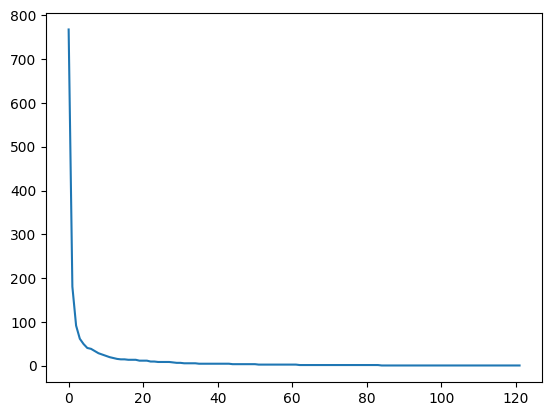

In [27]:
"""Take graphs with highest coverage and remove them from the remaining graphs."""
reduce_graphs_nodes = []
remaining_graph = full_graph.copy()
coverage_information = {}
iterations = 0
used_graph_idx = []

while len(remaining_graph.nodes()) > 1:
    
    # Find highest coverage within the unused benchmark graphs
    highest_coverage = (0, 0)
    
    for idx, benchmark_graph in enumerate(available_graphs):  

        if idx in used_graph_idx:
            continue

        overlap_nodes = np.intersect1d(list(benchmark_graph.nodes()), list(remaining_graph.nodes()))
        overlap = len(overlap_nodes)

        if overlap == highest_coverage[1] and overlap > 0:
             print(f"Remaining: {len(remaining_graph.nodes())} - Overlap between {idx} and {highest_coverage[0]}: {overlap}")

        if overlap > highest_coverage[1]:
            highest_coverage = (idx, overlap)
        
        if iterations == 0:
            coverage_information[list(ordered_graphs.keys())[idx]] = overlap

    
    # if iterations % 20  == 0:
    #     plt.figure(figsize=(20, 20), dpi=80)
    #     color_map_full = ['blue' if node in remaining_graph.nodes()  else 'green' for node in full_graph.nodes()]
    #     nx.draw(full_graph, pos_full, with_labels=False, arrows=True, node_color=color_map_full)
    #     plt.show()

    if highest_coverage[1] == 0:
        print(f"Failed to find graph with overlap, Remaining: {len(remaining_graph.nodes())}")
        break
    
    reduce_graphs_nodes.append(highest_coverage)
    
    # remove graph from unused graphs and nodes from remaining graph
    used_graph = available_graphs[highest_coverage[0]].copy()
    used_graph_idx.append(highest_coverage[0])
    remaining_graph.remove_nodes_from(used_graph.nodes())
    iterations += 1

plt.plot([x[1] for x in reduce_graphs_nodes])
plt.show()

In [38]:
# Check if unstable graphs were picked
for idx in used_graph_idx:
    if list(ordered_graphs.keys())[idx].rsplit("_", 1)[1] in unstable_benchmarks:
        print(f"Following unstable benchmark with idx {idx} was picked: {list(ordered_graphs.keys())[idx]}")

Following unstable benchmark with idx 155 was picked: 05-28-2023_BenchmarkChecksum-checksum-16
Following unstable benchmark with idx 126 was picked: 05-28-2023_BenchmarkChecksum-checksum-1


In [41]:
# Remove unstable nodes where dotfile name is same as db measurement
unstable_benchmarks_idx = []
for idx, graph in enumerate(final_graphs):    
    if list(ordered_graphs.keys())[idx].rsplit("_", 1)[1] in unstable_benchmarks:
        print("Removing unstable benchmark", list(ordered_graphs.keys())[idx])
        unstable_benchmarks_idx.append(idx)

print(unstable_benchmarks_idx)

Removing unstable benchmark 05-28-2023_BenchmarkChecksum-checksum-compressed-262144
Removing unstable benchmark 05-28-2023_BenchmarkChecksum-checksum-1
Removing unstable benchmark 05-28-2023_BenchmarkChecksum-checksum-16
[38, 126, 155]


Remaining: 1030 - Overlap between 14 and 12: 116
Remaining: 695 - Overlap between 24 and 12: 47
Remaining: 695 - Overlap between 159 and 73: 50
Remaining: 645 - Overlap between 113 and 24: 41
Remaining: 453 - Overlap between 136 and 71: 18
Remaining: 433 - Overlap between 17 and 1: 15
Remaining: 415 - Overlap between 17 and 1: 15
Remaining: 415 - Overlap between 136 and 42: 16
Remaining: 415 - Overlap between 168 and 42: 16
Remaining: 399 - Overlap between 40 and 17: 14
Remaining: 399 - Overlap between 131 and 17: 14
Remaining: 399 - Overlap between 142 and 136: 15
Remaining: 399 - Overlap between 176 and 136: 15
Remaining: 399 - Overlap between 193 and 136: 15
Remaining: 384 - Overlap between 40 and 17: 14
Remaining: 384 - Overlap between 131 and 17: 14
Remaining: 384 - Overlap between 168 and 17: 14
Remaining: 384 - Overlap between 193 and 176: 15
Remaining: 369 - Overlap between 40 and 17: 14
Remaining: 369 - Overlap between 197 and 17: 14
Remaining: 355 - Overlap between 5 and 4: 8

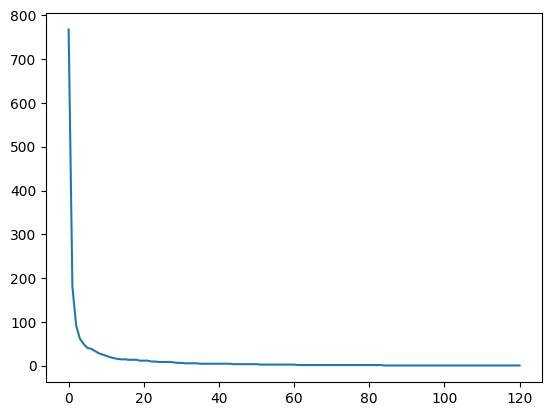

In [42]:
"""Take graphs with highest coverage and remove them from the remaining graphs."""
available_graphs = final_graphs.copy()
reduce_graphs_nodes = []
remaining_graph = full_graph.copy()
coverage_information = {}
iterations = 0
used_graph_idx = []

while len(remaining_graph.nodes()) > 1:
    
    # Find highest coverage within the unused benchmark graphs
    highest_coverage = (0, 0)
    
    for idx, benchmark_graph in enumerate(available_graphs):  

        if idx in used_graph_idx or idx in unstable_benchmarks_idx:
            continue

        overlap_nodes = np.intersect1d(list(benchmark_graph.nodes()), list(remaining_graph.nodes()))
        overlap = len(overlap_nodes)

        if overlap == highest_coverage[1] and overlap > 0:
             print(f"Remaining: {len(remaining_graph.nodes())} - Overlap between {idx} and {highest_coverage[0]}: {overlap}")

        if overlap > highest_coverage[1]:
            highest_coverage = (idx, overlap)
        
        if iterations == 0:
            coverage_information[list(ordered_graphs.keys())[idx]] = overlap

    
    # if iterations % 20  == 0:
    #     plt.figure(figsize=(20, 20), dpi=80)
    #     color_map_full = ['blue' if node in remaining_graph.nodes()  else 'green' for node in full_graph.nodes()]
    #     nx.draw(full_graph, pos_full, with_labels=False, arrows=True, node_color=color_map_full)
    #     plt.show()

    if highest_coverage[1] == 0:
        print(f"Failed to find graph with overlap, Remaining: {len(remaining_graph.nodes())}")
        break
    
    reduce_graphs_nodes.append(highest_coverage)
    
    # remove graph from unused graphs and nodes from remaining graph
    used_graph = available_graphs[highest_coverage[0]].copy()
    used_graph_idx.append(highest_coverage[0])
    remaining_graph.remove_nodes_from(used_graph.nodes())
    iterations += 1

plt.plot([x[1] for x in reduce_graphs_nodes])
plt.show()

In [61]:
class bcolors:
    HEADER = '\033[95m'
    OKBLUE = '\033[94m'
    OKCYAN = '\033[96m'
    OKGREEN = '\033[92m'
    WARNING = '\033[93m'
    FAIL = '\033[91m'
    ENDC = '\033[0m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'


In [60]:
performance_changes = ['BenchmarkShortIteratorNextArray/init_size_65535_shortIterator_next',
 'BenchmarkShortIteratorNextArray/init_size_650_shortIterator_next',
 'BenchmarkUnionBitset',
 # 'BenchmarkChecksum/checksum-compressed-32',
 'BenchmarkShortIteratorNextBitmap/init_size_650_shortIterator_next',
 'BenchmarkUnionInPlaceCopyOnWrite/10-7-3-3',
 #'BenchmarkChecksum/checksum-32',
 'BenchmarkChecksum/checksum-64',
 'BenchmarkChecksum/checksum-compressed-64',
 'BenchmarkShortIteratorNextBitmap/init_size_1_shortIterator_next',
 'BenchmarkIterateRoaring/iterator-compressed',
 'BenchmarkIterateRoaring/iterate-compressed',
 'BenchmarkSparseIterateRoaring',
 'BenchmarkIterateRoaring/iterator',
 'BenchmarkUnionInPlaceCopyOnWrite/10-4-3-3',
 'BenchmarkChecksum/checksum-16']

In [ ]:
BenchmarkShortIteratorNextBitmap-init_size_650_shortIterator_next
BenchmarkShortIteratorNextBitmap-init_size_6500_shortIterator_next

In [86]:
len(cleaned_performance_changes)

16

In [70]:
unique = set()
for perf in performance_changes:
    unique.add(perf.rsplit("/", 1)[0])

print(unique) 

{'BenchmarkShortIteratorNextBitmap', 'BenchmarkChecksum', 'BenchmarkIterateRoaring', 'BenchmarkUnionBitset', 'BenchmarkShortIteratorNextArray', 'BenchmarkUnionInPlaceCopyOnWrite', 'BenchmarkSparseIterateRoaring'}


In [ ]:
{'BenchmarkShortIteratorNextBitmap', 'BenchmarkIterateRoaring', 'BenchmarkShortIteratorNextArray'}

In [65]:
cleaned_performance_changes = []
for perf in performance_changes:
    cleaned_performance_changes.append(get_name_from_db_bench(perf))

In [102]:
ranking = []

for x in reduce_graphs_nodes:
    name = list(ordered_graphs.keys())[x[0]]
    name = name.split("_", 1)[1]
    ranking.append(name)

for idx, name in enumerate(list(ordered_graphs.keys())):
    if idx in [x[0] for x in reduce_graphs_nodes]:
        continue
    name = name.split("_", 1)[1]
    ranking.append(name)

# Create Boxplot

In [43]:
stabilities = []
for x in reduce_graphs_nodes:
    selected_bench = list(ordered_graphs.keys())[x[0]]
    try:
        name = selected_bench.split('_', 1)[1]
        stabilities.append(np.mean(stability_measures[name]))
    except KeyError:
        print(f"KeyError: {selected_bench}")

KeyError: 05-28-2023_BenchmarkNexts-nextmany__0.390625%
KeyError: 05-28-2023_BenchmarkIteratorAlloc-reverse_iteration
KeyError: 05-28-2023_BenchmarkOrs-two-by-two
KeyError: 05-28-2023_BenchmarkNexts-nextmany__3.125000%
KeyError: 05-28-2023_BenchmarkNexts-next__0.390625%
KeyError: 05-28-2023_BenchmarkNexts-next__25.000000%
KeyError: 05-28-2023_BenchmarkNextsRLE-nextmany
KeyError: 05-28-2023_BenchmarkNexts-next__1.562500%
KeyError: 05-28-2023_BenchmarkNexts-nextmany__50.000000%
KeyError: 05-28-2023_BenchmarkIteratorAlloc-many_iteration
KeyError: 05-28-2023_BenchmarkOrs-fast
KeyError: 05-28-2023_BenchmarkNexts-next__50.000000%
KeyError: 05-28-2023_BenchmarkNexts-next__6.250000%
KeyError: 05-28-2023_BenchmarkNexts-nextmany__100.000000%
KeyError: 05-28-2023_BenchmarkIteratorAlloc-reverse_iteration_with_alloc
KeyError: 05-28-2023_BenchmarkIteratorAlloc-many_iteration_with_alloc
KeyError: 05-28-2023_BenchmarkOrs-next-add


In [44]:
stabilities_old = []
for x in enumerate(final_graphs):
    selected_bench = list(ordered_graphs.keys())[x[0]]
    try:
        name = selected_bench.split('_', 1)[1]
        stabilities_old.append(np.mean(stability_measures[name]))
    except KeyError:
        print(f"KeyError: {selected_bench}")

KeyError: 05-28-2023_BenchmarkNexts-next__1.562500%
KeyError: 05-28-2023_BenchmarkNexts-nextmany__50.000000%
KeyError: 05-28-2023_BenchmarkNexts-nextmany__25.000000%
KeyError: 05-28-2023_BenchmarkNexts-next__0.097656%
KeyError: 05-28-2023_BenchmarkNexts-nextmany__3.125000%
KeyError: 05-28-2023_BenchmarkNexts-next__12.500000%
KeyError: 05-28-2023_BenchmarkNexts-nextmany__0.012352%
KeyError: 05-28-2023_BenchmarkNexts-next__0.390625%
KeyError: 05-28-2023_BenchmarkIteratorAlloc-many_iteration
KeyError: 05-28-2023_BenchmarkIteratorAlloc-simple_iteration
KeyError: 05-28-2023_BenchmarkNextsRLE-next
KeyError: 05-28-2023_BenchmarkOrs-fast
KeyError: 05-28-2023_BenchmarkNexts-next__50.000000%
KeyError: 05-28-2023_BenchmarkNexts-next__25.000000%
KeyError: 05-28-2023_BenchmarkNexts-next__6.250000%
KeyError: 05-28-2023_BenchmarkNexts-nextmany__12.500000%
KeyError: 05-28-2023_BenchmarkOrs-two-by-two
KeyError: 05-28-2023_BenchmarkNexts-next__0.012352%
KeyError: 05-28-2023_BenchmarkNexts-next__100.0000

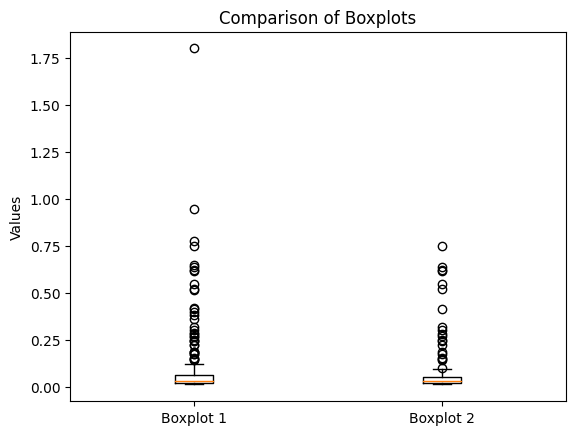

In [45]:
data = [stabilities_old, stabilities]

# Create a figure and axis
fig, ax = plt.subplots()

# Create the boxplot
boxplot = ax.boxplot(data, positions=[1, 2], labels=['Boxplot 1', 'Boxplot 2'])

# Set y-axis label
ax.set_ylabel('Values')

# Set title
ax.set_title('Comparison of Boxplots')

# Show the plot
plt.show()

In [88]:
found = []

for x in reduce_graphs_nodes:
    selected_bench = list(ordered_graphs.keys())[x[0]]
    selected_graph = available_graphs[x[0]].copy()
    try:
        name = selected_bench.split('_', 1)[1]
        
        if name in cleaned_performance_changes:
            print(f"{bcolors.WARNING} Selected graph {selected_bench} with {len(selected_graph.nodes())} nodes covering {x[1]} with stability {stability_measures[name]}{bcolors.ENDC}")
            found.append(name)
        else:
            print(f"Selected graph {selected_bench} with {len(selected_graph.nodes())} nodes covering {x[1]} with stability {stability_measures[name]}")
    except KeyError:
        print(f"Selected graph {selected_bench} with {len(selected_graph.nodes())} nodes covering {x[1]}")

Selected graph 05-28-2023_BenchmarkUnserializeReadFrom-ReadFrom-6500 with 768 nodes covering 768 with stability [0.04462426557363096, 0.05099300668524308, 0.04149466566786163]
Selected graph 05-28-2023_BenchmarkAndAny-small-filters_AndAny with 732 nodes covering 181 with stability [0.025402660851672462, 0.12534311147025995, 0.14630691279752867]
Selected graph 05-28-2023_BenchmarkUnserializeReadFrom-ReadFrom-650000 with 683 nodes covering 92 with stability [0.05425354520890566, 0.0840558876983671, 0.021068397727246956]
Selected graph 05-28-2023_BenchmarkMarshalBinary with 664 nodes covering 62 with stability [0.022267656279527297, 0.029620200467021508, 0.015637321225506248]
Selected graph 05-28-2023_BenchmarkChecksum-checksum-compressed-1024 with 571 nodes covering 50 with stability [0.2522748312361721, 0.3035451185112291, 0.057123216668491864]
Selected graph 05-28-2023_BenchmarkSparseAdvanceRoaring-advance_from_65 with 632 nodes covering 41 with stability [0.02325135069144421, 0.022040

In [93]:
def apfdP(N: int, T: int, R: list[int]) -> float:
    sum = 0
    for i in range(N):
        sum += R[i - 1] / N
    return sum / N

In [91]:
print(found)

['BenchmarkUnionInPlaceCopyOnWrite-10-4-3-3', 'BenchmarkShortIteratorNextArray-init_size_650_shortIterator_next', 'BenchmarkSparseIterateRoaring', 'BenchmarkChecksum-checksum-compressed-32', 'BenchmarkUnionBitset', 'BenchmarkShortIteratorNextBitmap-init_size_1_shortIterator_next', 'BenchmarkShortIteratorNextBitmap-init_size_650_shortIterator_next', 'BenchmarkChecksum-checksum-compressed-64', 'BenchmarkUnionInPlaceCopyOnWrite-10-7-3-3']


In [90]:
for perf in cleaned_performance_changes:
    if perf not in found:
        print(perf)

BenchmarkShortIteratorNextArray-init_size_65535_shortIterator_next
BenchmarkChecksum-checksum-32
BenchmarkChecksum-checksum-64
BenchmarkIterateRoaring-iterator-compressed
BenchmarkIterateRoaring-iterate-compressed
BenchmarkIterateRoaring-iterator
BenchmarkChecksum-checksum-16


In [94]:
reduce_graphs_nodes

[(63, 768),
 (164, 181),
 (83, 92),
 (26, 62),
 (73, 50),
 (24, 41),
 (12, 39),
 (113, 34),
 (183, 29),
 (0, 26),
 (74, 23),
 (204, 20),
 (71, 18),
 (42, 16),
 (136, 15),
 (176, 15),
 (17, 14),
 (40, 14),
 (197, 14),
 (131, 12),
 (142, 12),
 (161, 12),
 (98, 10),
 (192, 10),
 (72, 9),
 (84, 9),
 (96, 9),
 (97, 9),
 (22, 8),
 (190, 7),
 (193, 7),
 (5, 6),
 (106, 6),
 (111, 6),
 (159, 6),
 (25, 5),
 (54, 5),
 (95, 5),
 (102, 5),
 (123, 5),
 (133, 5),
 (166, 5),
 (187, 5),
 (206, 5),
 (76, 4),
 (105, 4),
 (117, 4),
 (124, 4),
 (128, 4),
 (144, 4),
 (185, 4),
 (23, 3),
 (53, 3),
 (90, 3),
 (119, 3),
 (137, 3),
 (140, 3),
 (157, 3),
 (158, 3),
 (168, 3),
 (173, 3),
 (18, 2),
 (19, 2),
 (29, 2),
 (39, 2),
 (41, 2),
 (44, 2),
 (59, 2),
 (61, 2),
 (65, 2),
 (77, 2),
 (100, 2),
 (101, 2),
 (109, 2),
 (118, 2),
 (139, 2),
 (141, 2),
 (148, 2),
 (154, 2),
 (156, 2),
 (170, 2),
 (174, 2),
 (199, 2),
 (202, 2),
 (1, 1),
 (2, 1),
 (3, 1),
 (4, 1),
 (8, 1),
 (9, 1),
 (21, 1),
 (34, 1),
 (35, 1),
 (43

# Old with idx bug

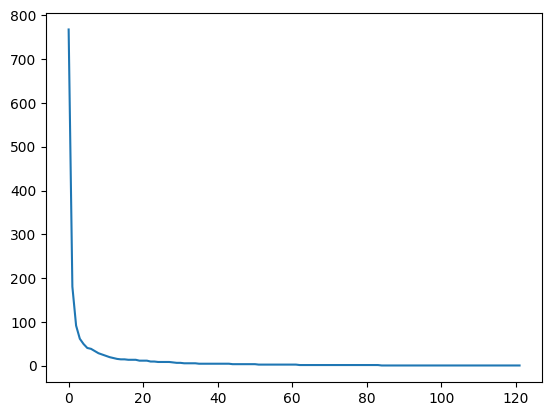

In [43]:
"""Take graphs with highest coverage and remove them from the remaining graphs."""
unused_graphs = final_graphs.copy()
reduce_graphs_nodes = []
remaining_graph = full_graph.copy()
coverage_information = {}
iterations = 0

while len(remaining_graph.nodes()) > 1:
    
    # Find highest coverage within the unused benchmark graphs
    highest_coverage = (0, 0)
    
    for idx, benchmark_graph in enumerate(unused_graphs):  

        overlap_nodes = np.intersect1d(list(benchmark_graph.nodes()), list(remaining_graph.nodes()))
        overlap = len(overlap_nodes)

        # if overlap == highest_coverage[1] and overlap > 0:
        #     print(f"Remaining: {len(remaining_graph.nodes())} - Overlap between {idx} and {highest_coverage[0]}: {overlap}")

        if overlap > highest_coverage[1]:
            highest_coverage = (idx, overlap)
        
        if iterations == 0:
            coverage_information[list(ordered_graphs.keys())[idx]] = overlap

    
    # if iterations % 20  == 0:
    #     plt.figure(figsize=(20, 20), dpi=80)
    #     color_map_full = ['blue' if node in remaining_graph.nodes()  else 'green' for node in full_graph.nodes()]
    #     nx.draw(full_graph, pos_full, with_labels=False, arrows=True, node_color=color_map_full)
    #     plt.show()

    if highest_coverage[1] == 0:
        print(f"Failed to find graph with overlap, Remaining: {len(remaining_graph.nodes())}")
        break
    
    reduce_graphs_nodes.append(highest_coverage)
    
    # remove graph from unused graphs and nodes from remaining graph
    used_graph = unused_graphs.pop(highest_coverage[0])
    remaining_graph.remove_nodes_from(used_graph.nodes())
    iterations += 1

plt.plot([x[1] for x in reduce_graphs_nodes])
plt.show()

In [46]:
print(len(final_graphs))
print(len(reduce_graphs_nodes))
print(reduce_graphs_nodes)

207
121
[(63, 768), (164, 181), (83, 92), (26, 62), (73, 50), (24, 41), (12, 39), (113, 34), (183, 29), (0, 26), (74, 23), (204, 20), (71, 18), (42, 16), (136, 15), (176, 15), (17, 14), (40, 14), (197, 14), (131, 12), (142, 12), (161, 12), (98, 10), (192, 10), (72, 9), (84, 9), (96, 9), (97, 9), (22, 8), (190, 7), (193, 7), (5, 6), (106, 6), (111, 6), (159, 6), (25, 5), (54, 5), (95, 5), (102, 5), (123, 5), (133, 5), (166, 5), (187, 5), (206, 5), (76, 4), (105, 4), (117, 4), (124, 4), (128, 4), (144, 4), (185, 4), (23, 3), (53, 3), (90, 3), (119, 3), (137, 3), (140, 3), (157, 3), (158, 3), (168, 3), (173, 3), (18, 2), (19, 2), (29, 2), (39, 2), (41, 2), (44, 2), (59, 2), (61, 2), (65, 2), (77, 2), (100, 2), (101, 2), (109, 2), (118, 2), (139, 2), (141, 2), (148, 2), (154, 2), (156, 2), (170, 2), (174, 2), (199, 2), (202, 2), (1, 1), (2, 1), (3, 1), (4, 1), (8, 1), (9, 1), (21, 1), (34, 1), (35, 1), (43, 1), (46, 1), (48, 1), (52, 1), (56, 1), (60, 1), (78, 1), (86, 1), (93, 1), (99, 1)

In [44]:
# Print removed benchmarks
# TODO [] Index is wrong here as well
for idx, name in enumerate(sorted(ordered_graphs.keys())):
    if idx not in [x[0] for x in reduce_graphs_nodes]:
        print(name)

05-28-2023_Benchmark100OrigNumberOfTrailingZeros
05-28-2023_BenchmarkAndAny-equal_and-first
05-28-2023_BenchmarkAndAny-small-base_AndAny
05-28-2023_BenchmarkAndAny-small-base_and-first
05-28-2023_BenchmarkAndAny-small-base_or-first
05-28-2023_BenchmarkAndAny-small-filters_AndAny
05-28-2023_BenchmarkAndAny-small-filters_or-first
05-28-2023_BenchmarkAntagonisticArrayUnionsGrowth
05-28-2023_BenchmarkArrayUnionThreshold-mostly-overlap
05-28-2023_BenchmarkBitmapReuseWithoutClear
05-28-2023_BenchmarkChecksum-checksum-1
05-28-2023_BenchmarkChecksum-checksum-131072
05-28-2023_BenchmarkChecksum-checksum-16
05-28-2023_BenchmarkChecksum-checksum-2048
05-28-2023_BenchmarkChecksum-checksum-32768
05-28-2023_BenchmarkChecksum-checksum-4
05-28-2023_BenchmarkChecksum-checksum-4096
05-28-2023_BenchmarkChecksum-checksum-512
05-28-2023_BenchmarkChecksum-checksum-524288
05-28-2023_BenchmarkChecksum-checksum-8
05-28-2023_BenchmarkChecksum-checksum-8192
05-28-2023_BenchmarkChecksum-checksum-compressed-16
05-

# 2. Sort by coverage and stability

In [45]:
# TODO index is not correct as it changes !!!
for el in sorted(reduce_graphs_nodes, key=lambda x: x[1], reverse=True):
    print(list(ordered_graphs.keys())[el[0]], el[1])

05-28-2023_BenchmarkUnserializeReadFrom-ReadFrom-6500 768
05-28-2023_BenchmarkSparseAdvanceSequentially-advance_from_2 181
05-28-2023_BenchmarkNexts-nextmany__12.500000% 92
05-28-2023_BenchmarkMarshalBinary 62
05-28-2023_BenchmarkUnserializeReadFrom-ReadFrom-650 50
05-28-2023_BenchmarkSparseAdvanceRoaring-advance_from_65 41
05-28-2023_BenchmarkChecksum-checksum-16384 39
05-28-2023_BenchmarkChecksum-checksum-compressed-1 34
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-10-10-10-3 29
05-28-2023_BenchmarkShortIteratorAdvanceRuntime-init_size_6500_shortIterator_advance 26
05-28-2023_BenchmarkChecksum-checksum-32 23
05-28-2023_BenchmarkFromBitmap16 20
06-06-2023_BenchmarkUnionInPlaceCopyOnWrite-10-10-3-3 18
05-28-2023_BenchmarkChecksum-checksum-compressed-262144 16
05-28-2023_BenchmarkChecksum-checksum-524288 15
05-28-2023_BenchmarkSparseAdvanceSequentially-advance_from_2 15
05-28-2023_BenchmarkNexts-next__0.097656% 14
05-28-2023_BenchmarkUnserializeFromBuffer-FromBuffer-6500 14
05-28-2023_Be

# [Option] Edge Coverage for self loops

In [25]:
# TODO Check if edge coverage makes a difference
count = 0
for e in full_graph.edges():
    if e[0] == e[1]:
        count += 1
print(f"Self loops: {count}")

Self loops: 45


In [246]:
def get_edge_lists_1d(graph):
    return [e[0] + e[1] for e in graph.edges()]

In [ ]:
"""Take graphs with highest coverage and remove them from the remaining graphs."""
reduce_graphs_nodes = []
remaining_graph = full_graph.copy()
unused_graphs = final_graphs.copy()

while len(remaining_graph.nodes()) > 1:
    
    # Find highest coverage within the unused benchmark graphs
    highest_coverage = (0, 0)
    
    for idx, benchmark_graph in enumerate(unused_graphs):  

        overlap_nodes = np.intersect1d(list(benchmark_graph.nodes()), list(remaining_graph.nodes()))
        overlap = len(overlap_nodes)

        # if overlap == highest_coverage[1] and overlap > 0:
        #     print(f"Remaining: {len(remaining_graph.nodes())} - Overlap between {idx} and {highest_coverage[0]}: {overlap}")

        if overlap > highest_coverage[1]:
            highest_coverage = (idx, overlap)

    
    # if iterations % 20  == 0:
    #     plt.figure(figsize=(20, 20), dpi=80)
    #     color_map_full = ['blue' if node in remaining_graph.nodes()  else 'green' for node in full_graph.nodes()]
    #     nx.draw(full_graph, pos_full, with_labels=False, arrows=True, node_color=color_map_full)
    #     plt.show()

    if highest_coverage[1] == 0:
        print(f"Failed to find graph with overlap, Remaining: {len(remaining_graph.nodes())}")
        break
    
    reduce_graphs_nodes.append(highest_coverage)
    
    # remove graph from unused graphs and nodes from remaining graph
    used_graph = unused_graphs.pop(highest_coverage[0])
    remaining_graph.remove_nodes_from(used_graph.nodes())

plt.plot([x[1] for x in reduce_graphs_nodes])
plt.show()

print(reduce_graphs_nodes)


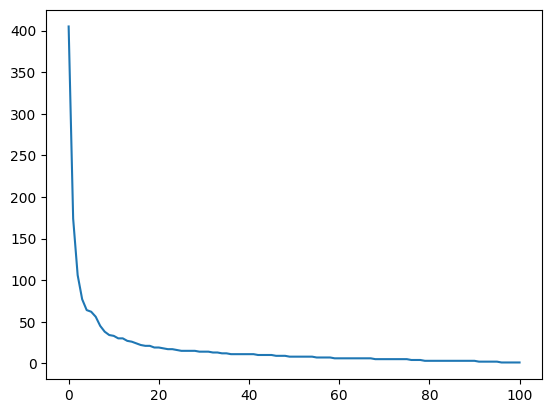

In [247]:
"""Take graphs with highest coverage and remove them from the remaining graphs."""
reduce_graphs_edges = []
remaining_graph = full_graph.copy()
node_overlap = []

while len(remaining_graph.edges()) > 1:
    # get graph with highest coverage
    highest_coverage = (0, 0)
    coverages = []
    for idx, g in enumerate(new_graphs):
        # get overlap with full graph
        overlap_edges = np.intersect1d(get_edge_lists_1d(g), get_edge_lists_1d(remaining_graph))
        overlap = len(overlap_edges)

        if overlap == highest_coverage[1] and overlap > 0:
            #print(f"Remaining: {len(remaining_graph.nodes())} - Overlap between {idx} and {highest_coverage[0]}: {overlap}")
            pass

        if overlap > highest_coverage[1]:
            highest_coverage = (idx, overlap)
            node_overlap.append(overlap)


    if iterations % 20  == 0 and False:
        plt.figure(figsize=(20, 20), dpi=80)
        nx.draw(remaining_graph, pos_full, with_labels=False, arrows=True)
        plt.show()

    
    reduce_graphs_edges.append(highest_coverage)
    remaining_graph.remove_edges_from(new_graphs[highest_coverage[0]].edges())

plt.plot([x[1] for x in reduce_graphs_edges])
plt.show()


In [75]:
# Check if there is a subset of graphs to evaluate reduction potential
for idx1, g1 in enumerate(final_graphs):
    for idx2, g2 in enumerate(final_graphs):
        # check for node overlap
        if idx1 == idx2:
            continue
        
        overlap_nodes = np.intersect1d(list(g1.nodes()), list(g2.nodes()))
        if overlap_nodes.size == len(g1.nodes()) or overlap_nodes.size == len(g2.nodes()):
            print(f"Overlap in nodes: {overlap_nodes.size}, one graph is a subset of the other")

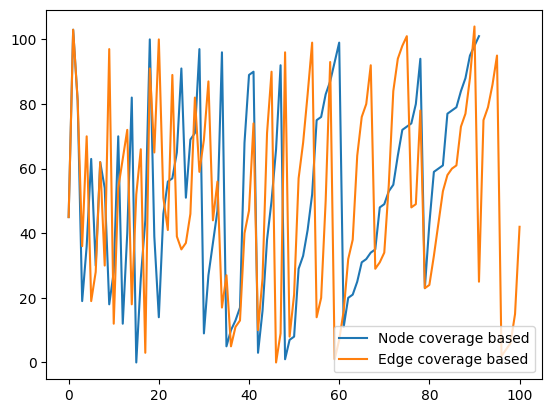

In [249]:
plt.plot([x[0] for x in reduce_graphs_nodes], label="Node coverage based")
plt.plot([x[0] for x in reduce_graphs_edges], label="Edge coverage based")
# plt.plot(node_overlap, label="Edge coverage based node overlap")
plt.legend()

In [250]:
inter = np.intersect1d([x[0] for x in reduce_graphs_nodes], [x[0] for x in reduce_graphs_edges])
len(inter)

92

In [251]:
reduced_new_graphs = new_graphs.copy()
unstable = "BenchmarkMarshal-ReferenceFile-map"
for idx, file in enumerate(dot_files):
    if unstable == get_name_from_dot(file):
        reduced_new_graphs.pop(idx)

No overlap found


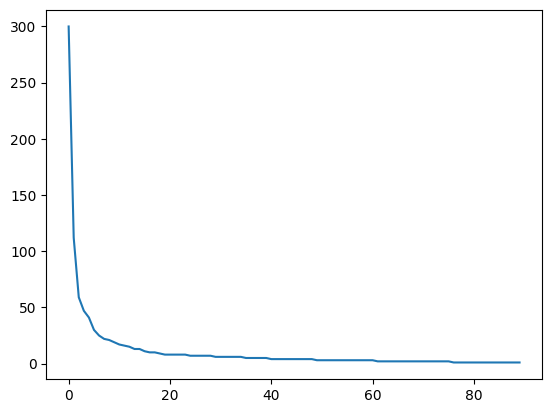

In [252]:
"""Take graphs with highest coverage and remove them from the remaining graphs."""
reduce_graphs_nodes_x = []
highest_coverage: tuple = (0, 0)
remaining_graph = full_graph.copy()
iterations = 0

while len(remaining_graph.nodes()) > 1:
    # get graph with highest coverage
    highest_coverage = (0, 0)
    coverages = []
    for idx, g in enumerate(reduced_new_graphs):
        # get overlap with full graph
        overlap_nodes = np.intersect1d(list(g.nodes()), list(remaining_graph.nodes()))
        overlap = len(overlap_nodes)

        if overlap == highest_coverage[1] and overlap > 0:
            #print(f"Remaining: {len(remaining_graph.nodes())} - Overlap between {idx} and {highest_coverage[0]}: {overlap}")
            pass

        if overlap > highest_coverage[1]:
            highest_coverage = (idx, overlap)

        coverages.append((idx, overlap))
    covs = sorted(coverages, key=itemgetter(1), reverse=True)
    iterations += 1

    if highest_coverage[1] == 0:
        print("No overlap found")
        break
    
    reduce_graphs_nodes_x.append(highest_coverage)
    remaining_graph.remove_nodes_from(reduced_new_graphs[highest_coverage[0]].nodes())

plt.plot([x[1] for x in reduce_graphs_nodes_x])
plt.show()


In [253]:
print(len(reduce_graphs_nodes_x))
print(len(remaining_graph.nodes()))

90
12


In [17]:
[x[1] for x in reduce_graphs_nodes]

NameError: name 'reduce_graphs_nodes' is not defined

In [254]:
inter = np.intersect1d([x[0] for x in reduce_graphs_nodes], [x[0] for x in reduce_graphs_nodes_x])
len(inter)

80

In [255]:
len(reduce_graphs_nodes_x)

90

In [256]:
len(new_graphs)

105

In [257]:
len(full_graph.nodes())

1054

In [258]:
for idx, file in enumerate(dot_files):
    if "BenchmarkMarshal-ReferenceFile-map" in file and "dot" in file:
        print(idx, file)

0 /Users/christopher/Uni/MasterThesis/exp2/instance0/backup-mt-1-instance-0/04-29-2023_BenchmarkMarshal-ReferenceFile-map_2_1_v2-0-1.dot
20 /Users/christopher/Uni/MasterThesis/exp2/instance0/backup-mt-1-instance-0/04-29-2023_BenchmarkMarshal-ReferenceFile-map_3_1_v2-0-1.dot
89 /Users/christopher/Uni/MasterThesis/exp2/instance0/backup-mt-1-instance-0/04-29-2023_BenchmarkMarshal-ReferenceFile-map_1_1_v2-0-1.dot


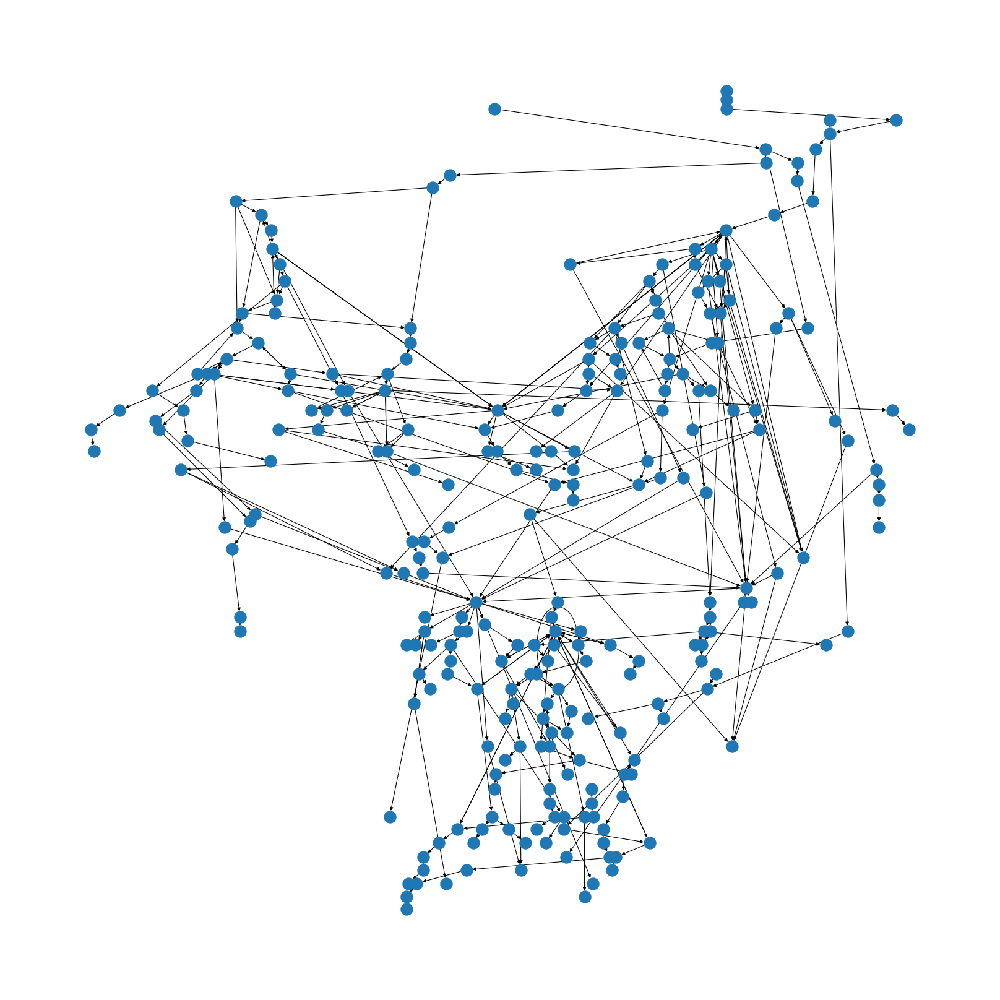

In [259]:
plt.figure(figsize=(20, 20), dpi=80)
nx.draw(new_graphs[0], pos_full, with_labels=False, arrows=True)

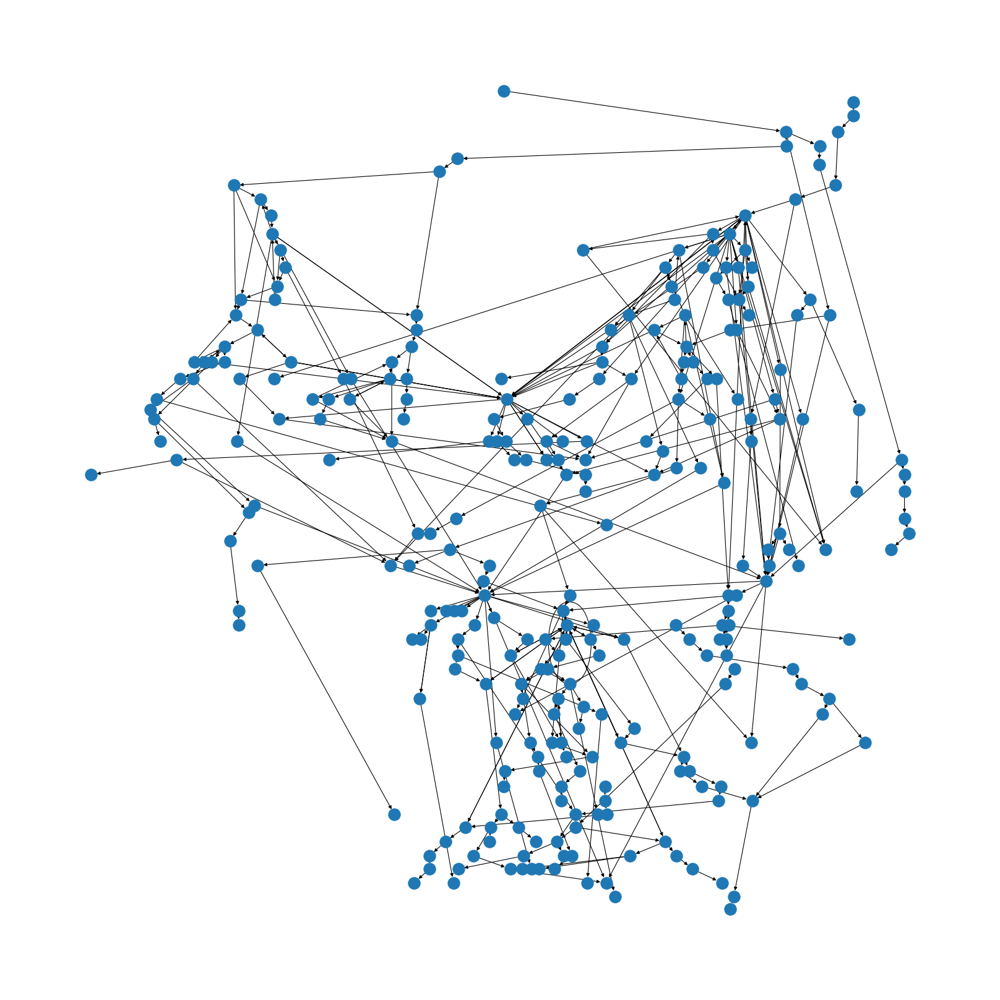

In [260]:
plt.figure(figsize=(20, 20), dpi=80)
nx.draw(new_graphs[20], pos_full, with_labels=False, arrows=True)

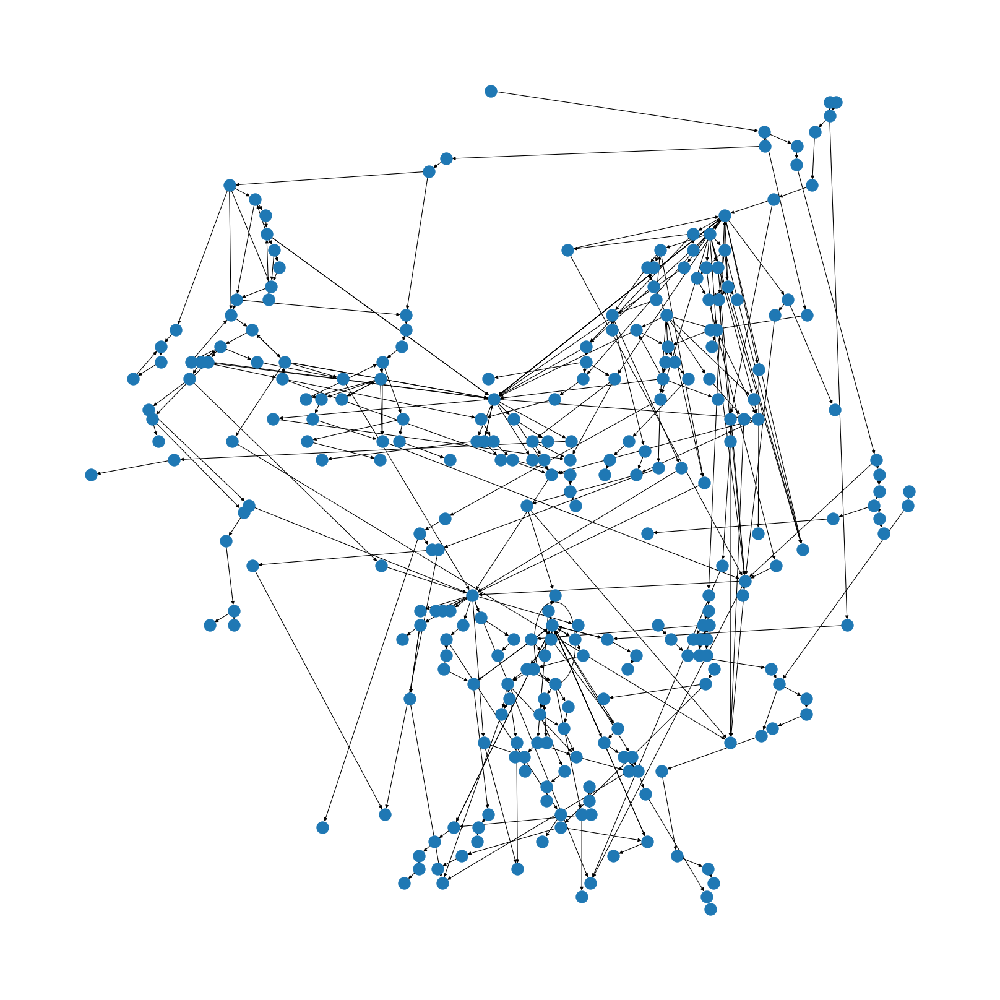

In [261]:
plt.figure(figsize=(20, 20), dpi=80)
nx.draw(new_graphs[89], pos_full, with_labels=False, arrows=True)

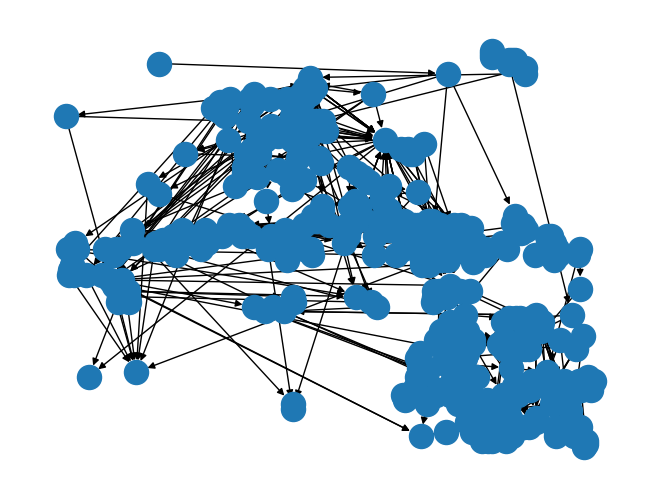

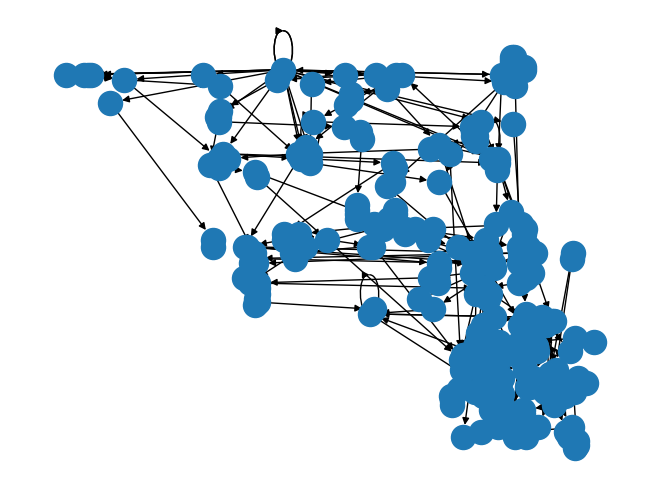

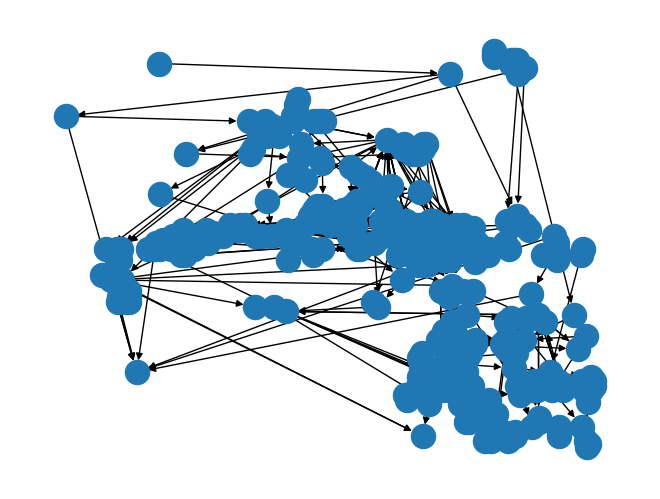

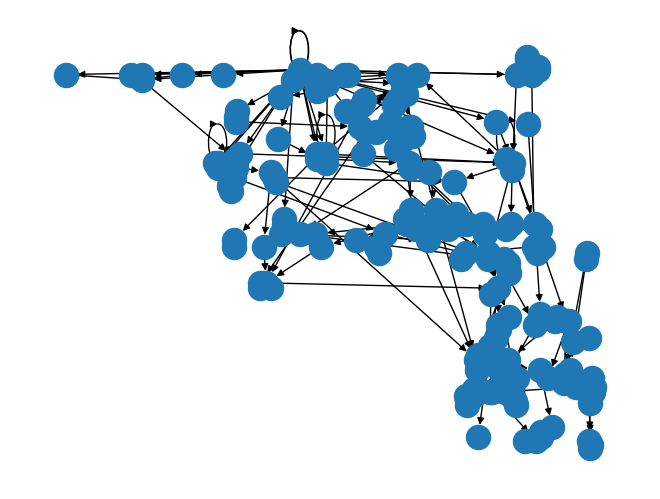

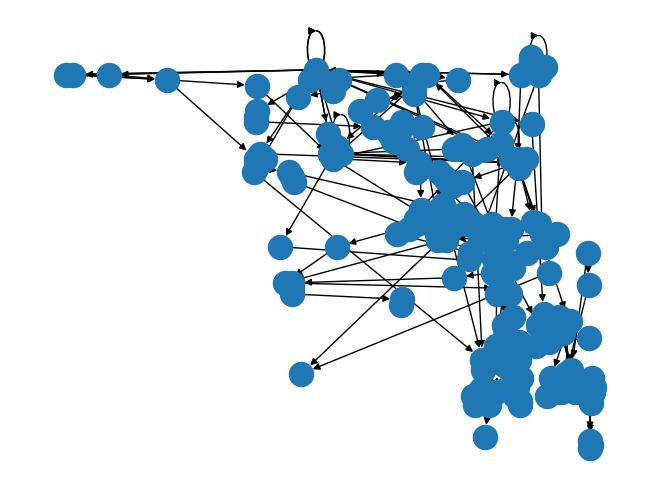

...

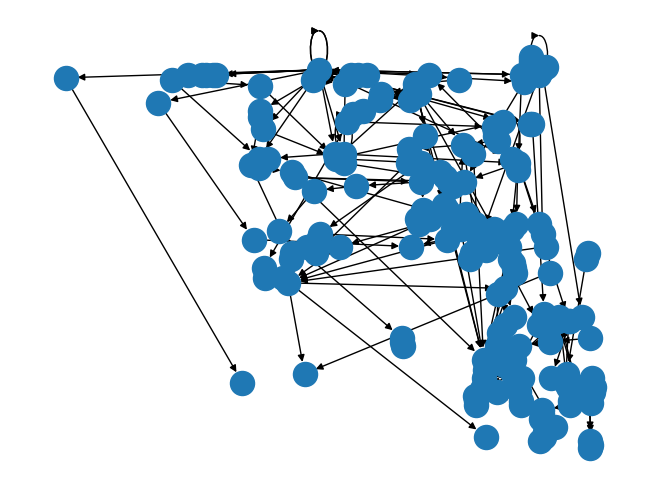

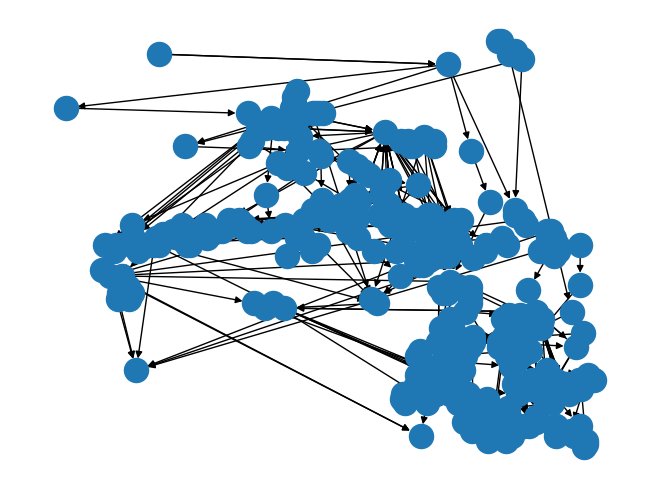

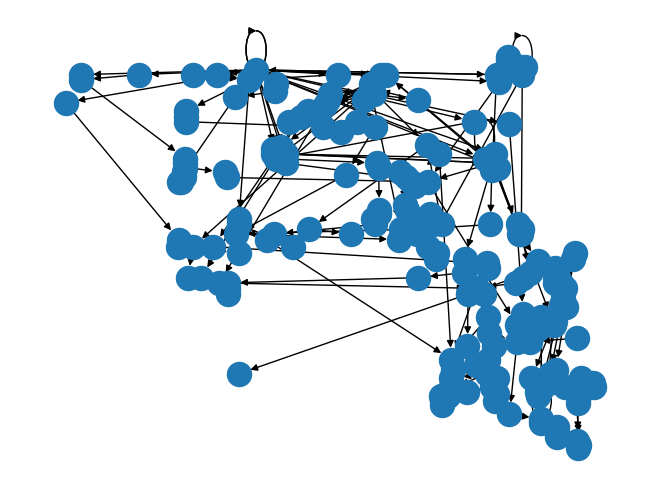

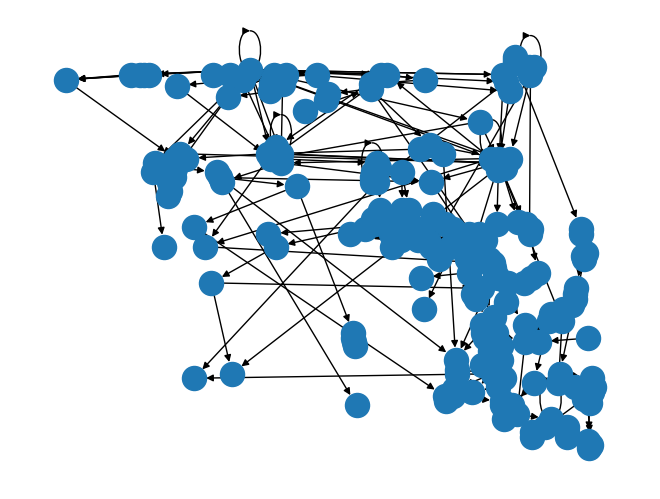

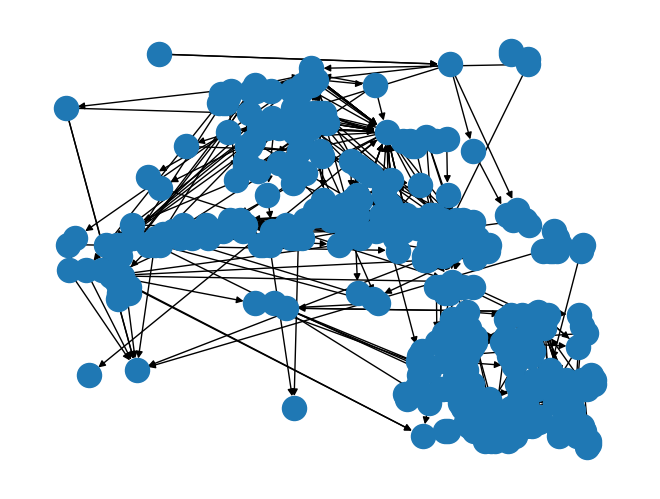

In [15]:
for graph in final_graphs:
    nx.draw(graph, pos_full, with_labels=False, arrows=True)
    plt.show()

In [105]:
perf_dict = {'BenchmarkShortIteratorNextArray-init_size_1_shortIterator_next': 0,
 'BenchmarkShortIteratorNextArray-init_size_65535_shortIterator_next': 7.090979340941406,
 'BenchmarkUnionInPlaceCopyOnWrite-4-10-10-3': 0,
 'BenchmarkChecksum-checksum-262144': 0,
 'BenchmarkSparseAdvanceRoaring-advance_from_2': 0.811800256574835,
 'Benchmark100CountTrailingZeros': 0.05568149272002776,
 'BenchmarkIntersectionLargeParallel': 0,
 'BenchmarkShortIteratorAdvanceRuntime-init_size_650_shortIterator_advance': 0,
 'BenchmarkUnserializeFromBuffer-FromBuffer-650': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-7-4-10-3': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-7-10-3-3': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-10-7-3-10': 0,
 'BenchmarkChecksum-checksum-compressed-1024': 0,
 'BenchmarkGetTestRoaring': 0,
 'BenchmarkIterateBitset': 0,
 'BenchmarkAndAny-equal_or-first': 0,
 'BenchmarkShortIteratorAdvanceBitmap-init_size_1_shortIterator_advance': 0,
 'BenchmarkShortIteratorNextRuntime-init_size_6500_shortIterator_next': 0,
 'BenchmarkShortIteratorAdvanceArray-init_size_6500_shortIterator_advance': 0,
 'BenchmarkShortIteratorAdvanceArray-init_size_65535_shortIterator_advance': 0.2826944693262279,
 'BenchmarkUnionInPlaceCopyOnWrite-4-4-3-10': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-4-7-3-3': 0.3416991081550913,
 'BenchmarkUnionInPlaceCopyOnWrite-7-7-3-10': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-10-4-10-10': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-10-10-3-3': 0,
 'BenchmarkSparseAdvanceSequentially-advance_from_650': 0.00757176834162987,
 'BenchmarkShortIteratorAdvanceRuntime-init_size_6500_shortIterator_advance': 0,
 'BenchmarkShortIteratorNextArray-init_size_650_shortIterator_next': 7.877774205286315,
 'BenchmarkEmptyArray': 0,
 'BenchmarkUnionBitset': 0.3425694199093776,
 'BenchmarkChecksum-checksum-compressed-32': 0,
 'BenchmarkChecksum-checksum-compressed-8192': 0,
 'BenchmarkShortIteratorNextBitmap-init_size_650_shortIterator_next': 4.556555151692477,
 'BenchmarkInPlaceArrayUnions': 0,
 'BenchmarkUnserializeReadFrom-ReadFrom-6500000': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-4-7-3-10': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-10-7-3-3': 0,
 'BenchmarkChecksum-checksum-32': 0,
 'BenchmarkChecksum-checksum-256': 0,
 'BenchmarkChecksum-checksum-compressed-16384': 0,
 'BenchmarkSerializationMid': 0,
 'BenchmarkEqualsSparse': 0.18126192411032083,
 'BenchmarkAndAny-small-filters_or-first': 0,
 'BenchmarkUnionRoaring': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-4-7-10-10': 0.27919188201853684,
 'BenchmarkChecksum-checksum-1': 0,
 'BenchmarkChecksum-checksum-64': 0,
 'BenchmarkChecksum-checksum-1024': 0,
 'BenchmarkGetTestBitSet': 0,
 'BenchmarkAndAny-small-base_and-first': 0,
 'BenchmarkAntagonisticArrayUnionsGrowth': 0,
 'BenchmarkNewBitmap': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-7-7-3-3': 0,
 'BenchmarkChecksum-checksum-512': 0,
 'BenchmarkSparseAdvanceSequentially-advance_from_65': 0,
 'BenchmarkShortIteratorAdvanceBitmap-init_size_65535_shortIterator_advance': 0,
 'BenchmarkRepeatedGrowthArrayUnion': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-4-10-3-10': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-7-7-10-3': 0,
 'BenchmarkChecksum-checksum-compressed-64': 0,
 'BenchmarkChecksum-checksum-32768': 0,
 'BenchmarkChecksum-checksum-65536': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-4-4-3-3': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-4-10-3-3': 0,
 'BenchmarkChecksum-checksum-compressed-32768': 0,
 'BenchmarkChecksum-checksum-524288': 0,
 'BenchmarkAndAny-equal_AndAny': 0,
 'BenchmarkShortIteratorNextBitmap-init_size_1_shortIterator_next': 32.475870304126595,
 'BenchmarkUnserializeFromBuffer-FromBuffer-6500': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-4-7-10-3': 1.4128869154335755,
 'BenchmarkChecksum-checksum-compressed-8': 0,
 'BenchmarkCountRoaring': 0,
 'BenchmarkIterateRoaring-iterator-compressed': 5.285475318923694,
 'BenchmarkIterateRoaring-iterate-compressed': 4.30573672466692,
 'BenchmarkSparseAdvanceRoaring-advance_from_65': 0.5745051026029624,
 'BenchmarkShortIteratorNextBitmap-init_size_6500_shortIterator_next': 0,
 'BenchmarkShortIteratorNextRuntime-init_size_65535_shortIterator_next': 1.227280032716549,
 'BenchmarkUnionInPlaceCopyOnWrite-7-10-3-10': 0,
 'BenchmarkChecksum-checksum-1048576': 0,
 'BenchmarkSparseIterateRoaring': 2.2693256644411464,
 'BenchmarkSparseAdvanceOnHugeData': 0,
 'BenchmarkSparseAdvanceSequentially-advance_from_2': 0,
 'BenchmarkSparseContains': 0,
 'BenchmarkAndAny-small-filters_and-first': 0.9533385274733686,
 'BenchmarkIntersectionCardinalityRoaring': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-10-4-10-3': 0,
 'BenchmarkIterateRoaring-iterator': 0.3026473188997514,
 'BenchmarkSparseAdvanceRoaring-advance_from_650': 0.36181169682497627,
 'BenchmarkEqualsClone': 1.2151069786085822,
 'BenchmarkPopcount': 0,
 'BenchmarkShortIteratorAdvanceRuntime-init_size_1_shortIterator_advance': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-4-4-10-3': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-10-7-10-3': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-10-10-10-3': 0,
 'BenchmarkChecksum-checksum-compressed-512': 0,
 'BenchmarkEvenIntervalArrayUnions': 0,
 'BenchmarkUnserializeReadFrom-ReadFrom-650': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-10-4-3-3': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-10-7-10-10': 0,
 'BenchmarkChecksum-checksum-16': 0,
 'BenchmarkChecksum-checksum-compressed-16': 0,
 'BenchmarkChecksum-checksum-compressed-524288': 0,
 'BenchmarkAndAny-small-base_or-first': 0,
 'BenchmarkArrayUnionThreshold-no-overlap': 0,
 'BenchmarkChecksum-checksum-2': 0,
 'BenchmarkChecksum-checksum-compressed-2': 0,
 'BenchmarkChecksum-checksum-compressed-128': 0,
 'BenchmarkChecksum-checksum-compressed-2048': 0,
 'BenchmarkChecksum-checksum-131072': 0,
 'BenchmarkUnserializeFromBuffer-FromBuffer-650000': 0,
 'BenchmarkMarshalBinary': 0,
 'BenchmarkUnmarshalBinary': 0,
 'BenchmarkChecksum-checksum-compressed-256': 0,
 'BenchmarkChecksum-checksum-4096': 0,
 'BenchmarkBitmapReuseWithoutClear': 0,
 'BenchmarkShortIteratorAdvanceBitmap-init_size_6500_shortIterator_advance': 0,
 'BenchmarkUnserializeFromBuffer-FromBuffer-6500000': 0,
 'BenchmarkChecksum-checksum-compressed-4': 0,
 'BenchmarkChecksum-checksum-compressed-262144': 2.1708038393475237,
 'BenchmarkSetBitset': 0,
 'BenchmarkCountBitset': 46.05406768080596,
 'BenchmarkUnserializeReadFrom-ReadFrom-65000': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-4-4-10-10': 0.2500283871520237,
 'BenchmarkChecksum-checksum-2048': 0,
 'BenchmarkIteratorAlloc-simple_iteration_with_alloc': 1.1806752755758487,
 'BenchmarkAndAny-small-filters_AndAny': 10.072986550858642,
 'BenchmarkUnionInPlaceCopyOnWrite-7-4-3-3': 0,
 'BenchmarkChecksum-checksum-4': 0,
 'BenchmarkChecksum-checksum-8192': 0,
 'BenchmarkUnserializeReadFrom-ReadFrom-650000': 0,
 'BenchmarkFromBitmap16': 0,
 'BenchmarkChecksum-checksum-16384': 0,
 'BenchmarkSparseIterateBitset': 0,
 'BenchmarkArrayUnionThreshold-little-overlap': 0,
 'BenchmarkShortIteratorNextRuntime-init_size_1_shortIterator_next': 0,
 'BenchmarkChecksum-checksum-8': 0,
 'BenchmarkChecksum-checksum-compressed-65536': 0,
 'BenchmarkXor': 0,
 'BenchmarkIterateRoaring-iterate': 1.1865959172730367,
 'BenchmarkRepeatedSelfArrayUnion': 0,
 'BenchmarkShortIteratorAdvanceArray-init_size_650_shortIterator_advance': 0,
 'BenchmarkChecksum-checksum-compressed-1': 0,
 'BenchmarkShortIteratorAdvanceBitmap-init_size_650_shortIterator_advance': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-7-4-10-10': 0,
 'BenchmarkSetRoaring': 0,
 'BenchmarkBitmapReuseWithClear': 0,
 'Benchmark100OrigNumberOfTrailingZeros': 0,
 'BenchmarkShortIteratorAdvanceRuntime-init_size_65535_shortIterator_advance': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-4-10-10-10': 0,
 'BenchmarkSparseAdvanceSequentially-advance_from_1': 0,
 'BenchmarkAndAny-small-base_AndAny': 0.5002628749410154,
 'BenchmarkUnionInPlaceCopyOnWrite-7-4-3-10': 0,
 'BenchmarkChecksum-checksum-128': 0,
 'BenchmarkXorLopsided': 0,
 'BenchmarkArrayUnionThreshold-mostly-overlap': 0,
 'BenchmarkShortIteratorAdvanceArray-init_size_1_shortIterator_advance': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-7-7-10-10': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-10-4-3-10': 0,
 'BenchmarkIntersectionLargeRoaring': 0.7349076538235577,
 'BenchmarkUnserializeFromBuffer-FromBuffer-65000': 0,
 'BenchmarkSerializationSparse': 0,
 'BenchmarkShortIteratorNextRuntime-init_size_650_shortIterator_next': 1.5785646912700457,
 'BenchmarkIntersectionBitset': 5.633977318671546,
 'BenchmarkChecksum-checksum-compressed-131072': 0,
 'BenchmarkSerializationDense': 0,
 'BenchmarkChecksum-checksum-compressed-4096': 0,
 'BenchmarkSparseAdvanceRoaring-advance_from_1': 0,
 'BenchmarkShortIteratorNextBitmap-init_size_65535_shortIterator_next': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-10-10-3-10': 0,
 'BenchmarkAndAny-equal_and-first': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-10-10-10-10': 0,
 'BenchmarkUnserializeReadFrom-ReadFrom-6500': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-7-10-10-10': 0.1532321485501087,
 'BenchmarkShortIteratorNextArray-init_size_6500_shortIterator_next': 7.702673041293329,
 'BenchmarkChecksum-checksum-compressed-1048576': 0,
 'BenchmarkUnionInPlaceCopyOnWrite-7-10-10-3': 0,
 'BenchmarkIntersectionRoaring': 0}

In [130]:
ranking_default = []
for idx, name in enumerate(list(ordered_graphs.keys())):
    name = name.split("_", 1)[1]
    ranking_default.append(name)

In [131]:
ranking_random = ranking_default.copy()
np.random.shuffle(ranking_random)

In [166]:
tops = np.asarray(list(perf_dict.values())).argsort()[-3:][::-1]
tops_key = [list(perf_dict.keys())[x] for x in tops]

In [171]:
def top3(top: list[str], R: list[str]) -> int:
    found = 0
    for idx, x in enumerate(R):
        if x in top:
            found += 1
            if found == len(top):
                return idx

In [155]:
def apfdP(changes: dict, R: list[str], T: float) -> float:
    N = len(R)
    sum = 0
    for i in range(N):
        sum_changes = 0
        for j in range(i):
            name = R[j]
            if name in changes.keys():
                sum_changes += changes[name]
            else:
                sum_changes += 0 
        sum += sum_changes / T
    return sum / N

In [176]:
ranking_reduced = []

for x in reduce_graphs_nodes:
    name = list(ordered_graphs.keys())[x[0]]
    name = name.split("_", 1)[1]
    ranking_reduced.append(name)

In [177]:
# APFD
T = sum(perf_dict.values())
print(f"improved ranking: {apfdP(perf_dict, ranking, T)}")
print(f"default ranking: {apfdP(perf_dict, ranking_default, T)}")
print(f"random ranking: {apfdP(perf_dict, ranking_random, T)}")

print(f"reduced ranking: {apfdP(perf_dict, ranking_reduced, T)}")

improved ranking: 0.5652592043741924
default ranking: 0.4398734167161248
random ranking: 0.36005354710705956
reduced ranking: 0.3375301273791034


In [175]:
# TOP3
print(f"improved ranking: {top3(tops_key, ranking)}")
print(f"default ranking: {top3(tops_key, ranking_default)}")
print(f"random ranking: {top3(tops_key, ranking_random)}")

improved ranking: 95
default ranking: 164
random ranking: 160
